Algorytm wykrywania obiektów w automatycznym systemie skanującym
 towary w koszyku w sklepie

In [4]:
import sys
if 'google.colab' in sys.modules:
    import subprocess
    subprocess.call("pip install -U opencv-python".split())

In [5]:
from random import randrange
import matplotlib.pyplot as plt
import numpy as np
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import requests
from bs4 import BeautifulSoup


print (cv2.__version__)

ModuleNotFoundError: No module named 'google.colab'

Pobranie zdjęć oryginalnych etykiet


In [ ]:
imagesGrayList = []


url = 'https://github.com/nataliasz1/twm_products_scanner/tree/master/labels_photos'
ext = 'jpg'
url_base = 'https://raw.githubusercontent.com'

page = requests.get(url).text
soup = BeautifulSoup(page, 'html.parser')
photos = [url_base  + node.get('href') for node in soup.find_all('a') if node.get('href').endswith(ext)]

for file in photos:
    print (file)


for photo in photos:
    
    productReq= requests.get(photo.replace('/blob',''), stream=True).raw
    productImg=np.asarray(bytearray(productReq.read()), dtype="uint8")
    productImgGRAY=cv2.imdecode(productImg,cv2.IMREAD_GRAYSCALE)
    imagesGrayList.append(productImgGRAY)
    productImgRGB=cv2.imdecode(productImg,cv2.COLOR_BGR2RGB)

    cv2_imshow(productImgRGB)

Pobranie zdjęć koszyka

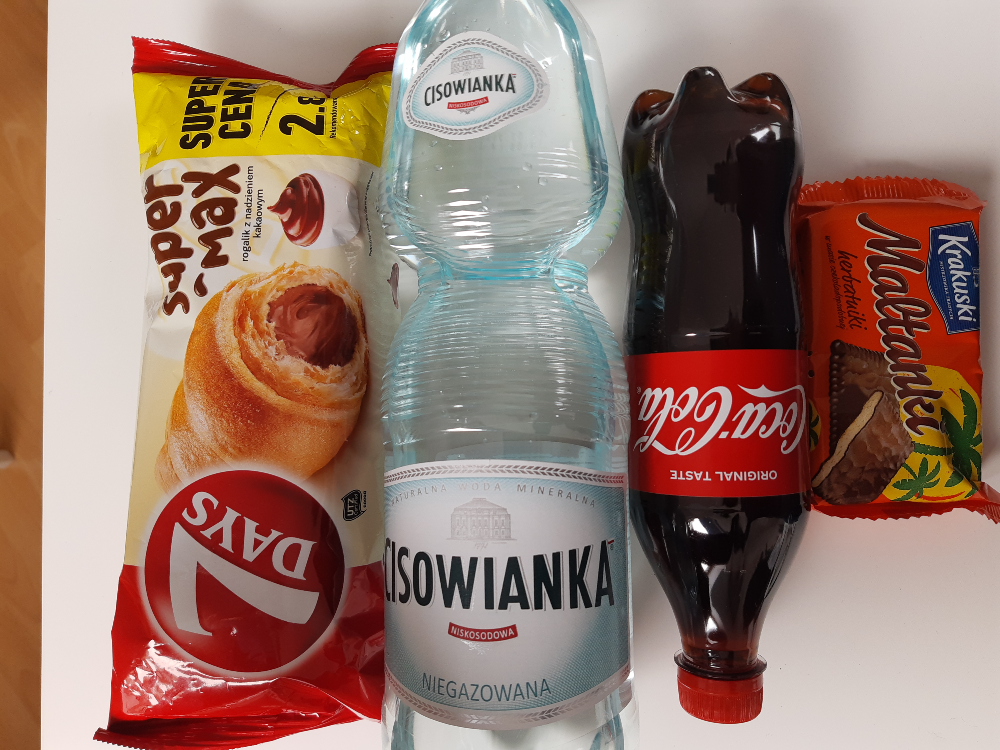

In [ ]:
trolleyUrl='https://raw.githubusercontent.com/nataliasz1/twm_products_scanner/master/trolley_images/1.jpg'
trolleyReq= requests.get(trolleyUrl, stream=True).raw
trolleyImg=np.asarray(bytearray(trolleyReq.read()), dtype="uint8")
trolleyImgGRAY=cv2.imdecode(trolleyImg,cv2.IMREAD_GRAYSCALE)
trolleyImgRGB=cv2.imdecode(trolleyImg,cv2.COLOR_BGR2RGB)
cv2_imshow(trolleyImgRGB)

Inicjalizacja detektora typu SIFT

In [ ]:
sift = cv2.SIFT_create()

Znajdywanie punktów szczegolnych w obu zdjęciach

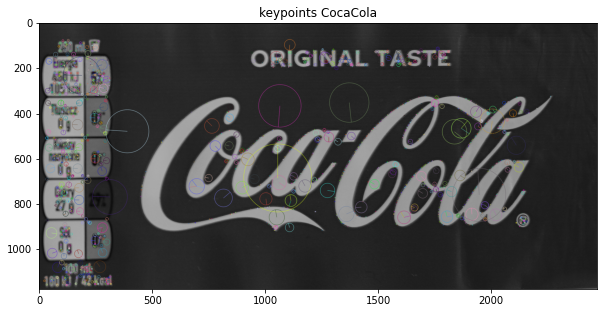

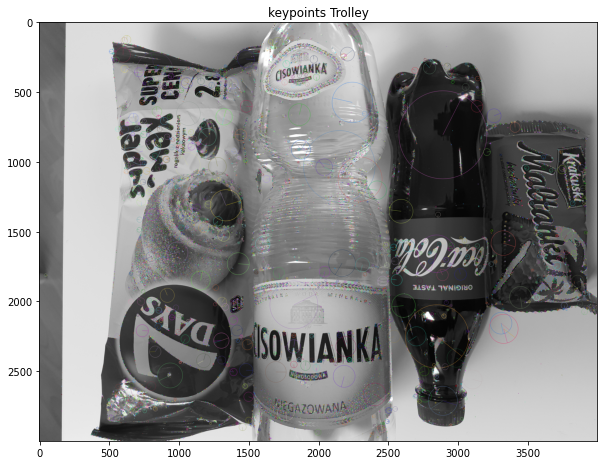

In [45]:
kpList = []
desList = []
for image in imagesGrayList:

    kpPhoto, desPhoto = sift.detectAndCompute(image,None)
    test = cv2.drawKeypoints(image, kpPhoto, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    kpList.append(kpPhoto)
    desList.append(desPhoto)
    plt.figure(figsize=(10,10))
    plt.imshow(test)
    plt.title("keypoints")
    plt.show()


kpTrolley, desTrolley = sift.detectAndCompute(trolleyImgGRAY,None)
test = cv2.drawKeypoints(trolleyImgGRAY, kpTrolley, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(10, 10))
plt.imshow(test)
plt.title("keypoints Trolley")
plt.show()


Fast Library for Approximate Nearest Neighbors

In [63]:
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50) 
flann = cv2.FlannBasedMatcher(index_params,search_params)
matches = []
for des in desList:
    matches.append(flann.knnMatch(des,desTrolley,k=2))


Zachowanie poprawnych dopasowań zgodnych z Lowe's ratio test

In [64]:
good = []
for match in matches:
    goodEl = []
    for m,n in match:
        if m.distance < 0.7*n.distance:
            
            goodEl.append(m)

    good.append(goodEl)

Jeżeli znaleziono więcej punktów niż MIN_MAYTCH_COUNT obiekt uznawany jest za znaleziony na zdjęciu testowym, naniesona ramka z obszarem gdzie wykryto etykiete



In [65]:
MIN_MATCH_COUNT =10

matchesMaskList = []

for goodEl in good:
    if len(goodEl)>MIN_MATCH_COUNT:
       
        product_pts = np.float32([ kpList[good.index(goodEl)][m.queryIdx].pt for m in goodEl ]).reshape(-1,1,2)
        trolley_pts = np.float32([ kpTrolley[m.trainIdx].pt for m in goodEl ]).reshape(-1,1,2)

        M, mask = cv2.findHomography(product_pts, trolley_pts, cv2.RANSAC,5.0)
        matchesMask = mask.ravel().tolist()
        matchesMaskList.append(matchesMask)

        h,w = imagesGrayList[good.index(goodEl)].shape
        pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
        dst = cv2.perspectiveTransform(pts,M)

        trolleyImgGRAY = cv2.polylines(trolleyImgGRAY,[np.int32(dst)],True,255,3, cv2.LINE_AA)

    else:
        print ("Not enough matches are found - %d/%d",len(good),MIN_MATCH_COUNT)
        matchesMask = None
        matchesMaskList.append(matchesMask)
    

Wyswietlenie dopasowanych punktów

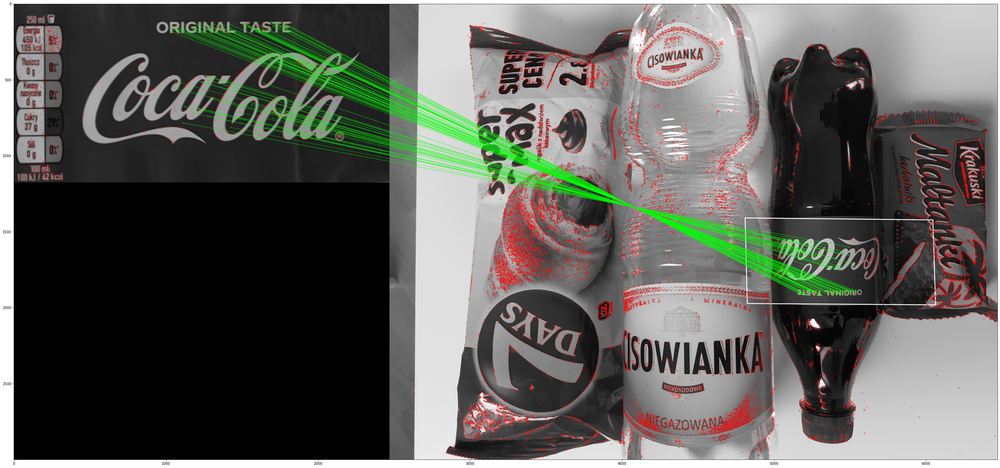

(<matplotlib.image.AxesImage at 0x7fe6d52e1f50>, None)

In [68]:
for matchesMask in matchesMaskList:

    draw_params = dict(matchColor = (0,255,0),
                      singlePointColor = (255,0,0),
                      matchesMask = matchesMask,
                      flags = cv2.DrawMatchesFlags_DEFAULT)
    matchedImg = cv2.drawMatches(imagesGrayList[matchesMaskList.index(matchesMask)],kpList[matchesMaskList.index(matchesMask)],trolleyImgGRAY,kpTrolley,good[matchesMaskList.index(matchesMask)],None,**draw_params)
    plt.figure(figsize=(50, 50))
    plt.imshow(matchedImg,'gray'),plt.show()